In [2]:
import os,os.path
os.environ['GOOGLE_APPLICATION_CREDENTIALS']=os.path.expanduser('C:\\Users\\Vera\\Desktop\\key\\project.json')
%load_ext google.cloud.bigquery
from google.cloud import bigquery
client = bigquery.Client()

The google.cloud.bigquery extension is already loaded. To reload it, use:
  %reload_ext google.cloud.bigquery


In [3]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
import pygeohash as gh

In [4]:
import datetime

In [5]:
%%bigquery data_trips --use_bqstorage_api
SELECT *
FROM
  `bigquery-public-data.new_york_citibike.citibike_trips`
WHERE
  start_station_latitude IS NOT NULL AND start_station_latitude!=0
  AND start_station_longitude IS NOT NULL AND start_station_latitude!=0
  AND  end_station_latitude IS NOT NULL
  AND end_station_latitude!=0
  AND end_station_longitude IS NOT NULL
  AND end_station_latitude!=0
LIMIT 250000

In [5]:
print(data_trips.head())
print(data_trips.shape)

   tripduration           starttime            stoptime  start_station_id  \
0           330 2015-03-09 17:15:00 2015-03-09 17:21:00               466   
1           795 2013-07-26 09:30:23 2013-07-26 09:43:38               318   
2           813 2017-08-06 18:26:56 2017-08-06 18:40:30               428   
3           618 2015-07-24 13:21:23 2015-07-24 13:31:41               153   
4          1503 2014-06-16 08:58:49 2014-06-16 09:23:52               442   

         start_station_name  start_station_latitude  start_station_longitude  \
0           W 25 St & 6 Ave               40.743954               -73.991449   
1  E 43 St & Vanderbilt Ave               40.753202               -73.977987   
2            E 3 St & 1 Ave               40.724677               -73.987834   
3           E 40 St & 5 Ave               40.752062               -73.981632   
4           W 27 St & 7 Ave               40.746647               -73.993915   

   end_station_id     end_station_name  end_station_lati

In [6]:
data_trips['geohash_start']=data_trips.apply(lambda x: gh.encode(x.start_station_latitude, x.start_station_longitude, precision=10), axis=1)
data_trips['geohash_end']=data_trips.apply(lambda x: gh.encode(x.end_station_latitude, x.end_station_longitude, precision=10), axis=1)
data_trips['geohash_start_7']=data_trips.apply(lambda x: gh.encode(x.start_station_latitude, x.start_station_longitude, precision=7), axis=1)
data_trips['geohash_end_7']=data_trips.apply(lambda x: gh.encode(x.end_station_latitude, x.end_station_longitude, precision=7), axis=1)
data_trips['geohash_start_5']=data_trips.apply(lambda x: gh.encode(x.start_station_latitude, x.start_station_longitude, precision=5), axis=1)
data_trips['geohash_end_5']=data_trips.apply(lambda x: gh.encode(x.end_station_latitude, x.end_station_longitude, precision=5), axis=1)
print(data_trips.head())

   tripduration               starttime                stoptime  \
0           437 2018-03-29 18:48:21.032 2018-03-29 18:55:38.808   
1           987 2016-09-13 07:53:30.000 2016-09-13 08:09:58.000   
2          1827 2015-05-07 14:14:57.000 2015-05-07 14:45:24.000   
3          1103 2017-12-27 07:53:04.000 2017-12-27 08:11:27.000   
4           445 2016-07-10 21:37:21.000 2016-07-10 21:44:47.000   

   start_station_id       start_station_name  start_station_latitude  \
0              3101    N 12 St & Bedford Ave               40.720798   
1               515         W 43 St & 10 Ave               40.760094   
2               417   Barclay St & Church St               40.712912   
3              3260  Mercer St & Bleecker St               40.727064   
4              3176   W 64 St & West End Ave               40.774528   

   start_station_longitude  end_station_id         end_station_name  \
0               -73.954847            3082      Hope St & Union Ave   
1               -73.99

In [7]:
data_trips_count=data_trips.sort_values(['geohash_start','geohash_end'],ascending=False).groupby(['geohash_start','geohash_end'])
data_trips_count_7=data_trips.sort_values(['geohash_start_7','geohash_end_7'],ascending=False).groupby(['geohash_start_7','geohash_end_7'])
data_trips_count_5=data_trips.sort_values(['geohash_start_5','geohash_end_5'],ascending=False).groupby(['geohash_start_5','geohash_end_5'])

In [8]:
%matplotlib qt 
fig, axes = plt.subplots(nrows=3, ncols=2)

data_trips['geohash_start'].value_counts()[:20].plot.barh(ax=axes[0,0])
data_trips['geohash_end'].value_counts()[:20].plot.barh(ax=axes[0,1])
data_trips['geohash_start_7'].value_counts()[:20].plot.barh(ax=axes[1,0])
data_trips['geohash_end_7'].value_counts()[:20].plot.barh(ax=axes[1,1])
data_trips['geohash_start_5'].value_counts()[:20].plot.barh(ax=axes[2,0])
data_trips['geohash_end_5'].value_counts()[:20].plot.barh(ax=axes[2,1])

In [9]:
start_5=data_trips['geohash_start_5'].value_counts()[:20].to_frame()
end_5=data_trips['geohash_end_5'].value_counts()[:20].to_frame()
#start_5.combine(end_5, max, fill_value=0)
start_end=pd.concat([start_5, end_5], axis=1,sort=True)
start_end=start_end.dropna()
start_end['geohash_start_5']=start_end['geohash_start_5'].astype('int64')
start_end['geohash_end_5']=start_end['geohash_end_5'].astype('int64')
start_end['The_area'] = ['the_most_popular' if (x >10000) | (y > 10000) else 'The_less_popular' for x,y in zip(start_end.geohash_start_5,start_end.geohash_end_5)]
print(start_end)

       geohash_start_5  geohash_end_5          The_area
dr5r7             1149           1229  The_less_popular
dr5re            32196          34483  the_most_popular
dr5rg             7168           7193  The_less_popular
dr5rk            11338          11268  the_most_popular
dr5rm             1423           1345  The_less_popular
dr5rs            86483          86200  the_most_popular
dr5rt             4732           4571  The_less_popular
dr5ru            89454          88152  the_most_popular
dr5rv             5662           5710  The_less_popular
dr5ry               49             49  The_less_popular
dr72h             6857           6283  The_less_popular
dr72j             3488           3510  The_less_popular
f25dv                1              1  The_less_popular


In [7]:
popular=['dr5rs','dr5ru']
medium_popular=['dr5re','dr5rk','dr5rg','dr72h']
data_trips['area']=['popular' if ((x in popular)&(y in popular)) else 'medium_popular' if ((x in medium_popular)|(y in medium_popular)) else 'non_popular' for x,y in zip(data_trips.geohash_start_5, data_trips.geohash_end_5)]


In [8]:
from pandas.api.types import CategoricalDtype 
cat_t=CategoricalDtype(['popular', 'medium_popular', 'non_popular'], ordered=True)
data_trips['area']=data_trips['area'].astype(cat_t)

In [12]:
print(data_trips.area.head(5))

0           popular
1           popular
2    medium_popular
3           popular
4           popular
Name: area, dtype: category
Categories (3, object): [popular < medium_popular < non_popular]


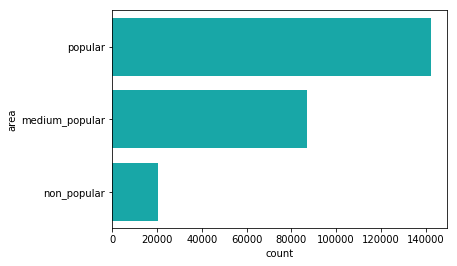

In [13]:
%matplotlib inline
sns.countplot(y="area", data=data_trips, color="c")

In [9]:
data_trips1=data_trips.sample(frac=0.2)
data_trips['area'].value_counts()
data_trips1['area'].iloc[1]

'popular'

In [26]:
%%time

m1 = folium.Map(location=[40.767937,-73.982155 ],tiles='OpenStreetMap',
 zoom_start=12)

for row in data_trips1.iterrows():
    #for i in range(0,len(data_trips1)):
        cat = row[1]['area']
        if cat == 'popular':
            folium.CircleMarker([row[1]['start_station_latitude'], row[1]['start_station_longitude']],
                        color='orange',
                        popup=('start_station_name:'+str(row[1]['start_station_name'])),
                        #fill_color='yellow',
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(m1)

            folium.CircleMarker([row[1]['end_station_latitude'], row[1]['end_station_longitude']],
                        radius=10,
                        color='darkorange',
                        popup=('end_station_name:'+str(row[1]['end_station_name'])),
                        #fill_color='blue',
                        #popup=str(row[1]['end_station_name'])
                       ).add_to(m1)
        elif cat == 'medium_popular':
            folium.CircleMarker([row[1]['start_station_latitude'], row[1]['start_station_longitude']],
                        color='green',
                        popup=('start_station_name:'+str(row[1]['start_station_name'])),
                        #fill_color='yellow',
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(m1)

            folium.CircleMarker([row[1]['end_station_latitude'], row[1]['end_station_longitude']],
                        radius=10,
                        color='darkgreen',
                        popup=('end_station_name:'+str(row[1]['end_station_name'])),
                        #fill_color='blue',
                        #popup=str(row[1]['end_station_name'])
                       ).add_to(m1)
        else:
            folium.CircleMarker([row[1]['start_station_latitude'], row[1]['start_station_longitude']],
                        color='blue',
                        popup=('start_station_name:'+str(row[1]['start_station_name'])),
                        #fill_color='yellow',
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(m1)

            folium.CircleMarker([row[1]['end_station_latitude'], row[1]['end_station_longitude']],
                        radius=10,
                        color='darkblue',
                        popup=('end_station_name:'+str(row[1]['end_station_name'])),
                        #fill_color='blue',
                        #popup=str(row[1]['end_station_name'])
                       ).add_to(m1)

m1

Wall time: 27.4 s


In [27]:
m1.save('C:\\Users\\Vera\\Desktop\\map_popular.html')

In [10]:
data_trips_popular=data_trips1[data_trips1['area']=='popular']
data_trips_medium_popular=data_trips1[data_trips1['area']=='medium_popular']
data_trips_less_popular=data_trips1[data_trips1['area']=='non_popular']

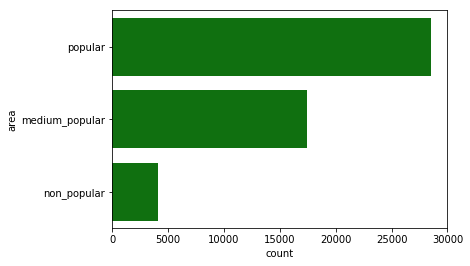

In [16]:
%matplotlib inline
sns.countplot(y="area", data=data_trips1, color="g")

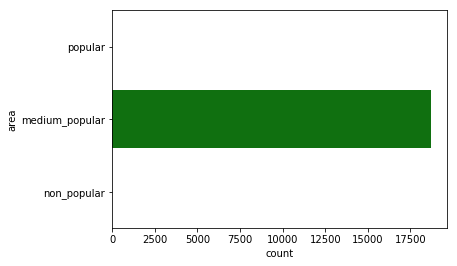

In [20]:
%matplotlib inline
sns.countplot(y="area", data=data_trips_medium_popular, color="g")

In [30]:
%%time

from folium.plugins import MarkerCluster

mapa_layer_claster = folium.Map(location=[40.767937,-73.982155 ],tiles='OpenStreetMap',
 zoom_start=12)

marker_cluster = MarkerCluster().add_to(mapa_layer_claster)

for row in data_trips_popular.iterrows():
    marker=folium.CircleMarker([row[1]['start_station_latitude'], row[1]['start_station_longitude']],
                        color='orange',
                        popup=('popular_start:'+str(row[1]['start_station_name'])),
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(marker_cluster)
    marker_cluster.add_child(marker)
    marker=folium.CircleMarker([row[1]['end_station_latitude'], row[1]['end_station_longitude']],
                        color='darkorange',
                        popup=('popular_end:'+str(row[1]['end_station_name'])),
                        #fill_color='blue',
                        #popup=str(row[1]['end_station_name'])
                       ).add_to(marker_cluster)
    marker_cluster.add_child(marker)
    
for row in data_trips_medium_popular.iterrows():
    marker=folium.CircleMarker([row[1]['start_station_latitude'], row[1]['start_station_longitude']],
                        color='green',
                        popup=('medium_popular_start:'+str(row[1]['start_station_name'])),
                        #fill_color='yellow',
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(marker_cluster)
    marker_cluster.add_child(marker)
    marker=folium.CircleMarker([row[1]['end_station_latitude'], row[1]['end_station_longitude']],
                        color='darkgreen',
                        popup=('medium_popular_end:'+str(row[1]['end_station_name'])),
                        #fill_color='blue',
                        #popup=str(row[1]['end_station_name'])
                       ).add_to(marker_cluster)
    marker_cluster.add_child(marker)
                               
for row in data_trips_less_popular.iterrows():
    marker=folium.CircleMarker([row[1]['start_station_latitude'], row[1]['start_station_longitude']],
                        color='blue',
                        popup=('non_popular_start:'+str(row[1]['start_station_name'])),
                        #fill_color='yellow',
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(marker_cluster)
    marker_cluster.add_child(marker)
    marker=folium.CircleMarker([row[1]['end_station_latitude'], row[1]['end_station_longitude']],
                        color='darkblue',
                        popup=('non_popular_end:'+str(row[1]['end_station_name'])),
                        #fill_color='blue',
                        #popup=str(row[1]['end_station_name'])
                       ).add_to(marker_cluster)
    marker_cluster.add_child(marker)

marker_cluster.add_to(mapa_layer_claster)

folium.LayerControl().add_to(mapa_layer_claster)

Wall time: 29.1 s


In [31]:
mapa_layer_claster.save('C:\\Users\\Vera\\Desktop\\mapa_layer_popular_claster.html')

The most popular area by gender

In [11]:
data_trips_gender=data_trips[data_trips['gender']!='unknown']

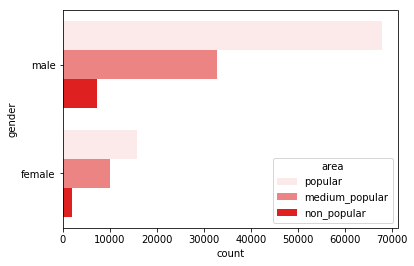

In [18]:
%matplotlib inline
sns.countplot(y="gender",hue='area', data=data_trips_gender, color="r")

In [12]:
data_trips1_gender=data_trips_gender.sample(frac=0.3)
data_trips1_male=data_trips1_gender[data_trips1_gender['gender']=='male']
data_trips1_female=data_trips1_gender[data_trips1_gender['gender']=='female']
print(data_trips1_gender.shape)

(24862, 23)


In [36]:
%%time

from folium import FeatureGroup, LayerControl

mapa_gender = folium.Map(location=[40.767937,-73.982155 ],tiles='OpenStreetMap',
 zoom_start=12)

feature_group = FeatureGroup(name='male')

for row in data_trips1_male.iterrows():
    cat = row[1]['area']
    if cat == 'popular': 
        folium.CircleMarker([row[1]['start_station_latitude'], row[1]['start_station_longitude']],
                        color='orange',
                        popup=('male_popular_start:'+str(row[1]['start_station_name'])),
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(feature_group)
        folium.CircleMarker([row[1]['end_station_latitude'], row[1]['end_station_longitude']],
                        color='orange',
                        popup=('male_popular_end:'+str(row[1]['end_station_name'])),
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(feature_group)
    elif cat=='medium_popular':
        folium.CircleMarker([row[1]['start_station_latitude'], row[1]['start_station_longitude']],
                        color='green',
                        popup=('male_medium_popular_start:'+str(row[1]['start_station_name'])),
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(feature_group)
        folium.CircleMarker([row[1]['end_station_latitude'], row[1]['end_station_longitude']],
                        color='green',
                        popup=('male_medium_popular_end:'+str(row[1]['end_station_name'])),
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(feature_group)
    else:
        folium.CircleMarker([row[1]['start_station_latitude'], row[1]['start_station_longitude']],
                        color='blue',
                        popup=('male_less_popular_start:'+str(row[1]['start_station_name'])),
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(feature_group)
        folium.CircleMarker([row[1]['end_station_latitude'], row[1]['end_station_longitude']],
                        color='blue',
                        popup=('male_less_popular_end:'+str(row[1]['end_station_name'])),
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(feature_group)
        
feature_group1 = FeatureGroup(name='female')

for row in data_trips1_female.iterrows():
    cat = row[1]['area']
    if cat=='popular': 
        folium.CircleMarker([row[1]['start_station_latitude'], row[1]['start_station_longitude']],
                        color='red',
                        popup=('female_popular_start:'+str(row[1]['start_station_name'])),
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(feature_group1)
        folium.CircleMarker([row[1]['end_station_latitude'], row[1]['end_station_longitude']],
                        color='red',
                        popup=('female_popular_end:'+str(row[1]['end_station_name'])),
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(feature_group1)
    elif cat=='medium_popular':
        folium.CircleMarker([row[1]['start_station_latitude'], row[1]['start_station_longitude']],
                        color='cyan',
                        popup=('female_medium_popular_start:'+str(row[1]['start_station_name'])),
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(feature_group1)
        folium.CircleMarker([row[1]['end_station_latitude'], row[1]['end_station_longitude']],
                        color='cyan',
                        popup=('female_medium_popular_end:'+str(row[1]['end_station_name'])),
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(feature_group1)
    else:
        folium.CircleMarker([row[1]['start_station_latitude'], row[1]['start_station_longitude']],
                        color='magenta',
                        popup=('female_less_popular_start:'+str(row[1]['start_station_name'])),
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(feature_group1)
        folium.CircleMarker([row[1]['end_station_latitude'], row[1]['end_station_longitude']],
                        color='magenta',
                        popup=('female_less_popular_end:'+str(row[1]['end_station_name'])),
                        #popup=str(row[1]['start_station_name'])
                       ).add_to(feature_group1)
        
feature_group.add_to(mapa_gender)
feature_group1.add_to(mapa_gender)
LayerControl().add_to(mapa_gender)

Wall time: 21.6 s


In [38]:
mapa_gender.save('C:\\Users\\Vera\\Desktop\\mapa_gender.html')

The most popular area by seasons

In [13]:
data_trips['year']=data_trips['starttime'].dt.year
data_trips['month']=data_trips['starttime'].dt.month
data_trips['day']=data_trips['starttime'].dt.day
data_trips['day_of_week']=data_trips['starttime'].dt.weekday_name
data_trips['hour_of_day']=data_trips['starttime'].dt.hour

In [21]:
data_trips.isna().sum()

tripduration                    0
starttime                       0
stoptime                        0
start_station_id                0
start_station_name              0
start_station_latitude          0
start_station_longitude         0
end_station_id                  0
end_station_name                0
end_station_latitude            0
end_station_longitude           0
bikeid                          0
usertype                        0
birth_year                 113359
gender                          0
customer_plan                   0
geohash_start                   0
geohash_end                     0
geohash_start_7                 0
geohash_end_7                   0
geohash_start_5                 0
geohash_end_5                   0
area                            0
year                            0
month                           0
day                             0
day_of_week                     0
hour_of_day                     0
dtype: int64

In [22]:
print(data_trips.head(2))

   tripduration           starttime            stoptime  start_station_id  \
0           330 2015-03-09 17:15:00 2015-03-09 17:21:00               466   
1           795 2013-07-26 09:30:23 2013-07-26 09:43:38               318   

         start_station_name  start_station_latitude  start_station_longitude  \
0           W 25 St & 6 Ave               40.743954               -73.991449   
1  E 43 St & Vanderbilt Ave               40.753202               -73.977987   

   end_station_id  end_station_name  end_station_latitude     ...      \
0             509   9 Ave & W 22 St             40.745497     ...       
1             513  W 56 St & 10 Ave             40.768254     ...       

   geohash_start_7  geohash_end_7 geohash_start_5 geohash_end_5     area  \
0          dr5ru31        dr5ru13           dr5ru         dr5ru  popular   
1          dr5rudf        dr5rume           dr5ru         dr5ru  popular   

   year month day day_of_week hour_of_day  
0  2015     3   9      Monday     

In [14]:
data_trips['period']=['morning' if ((x >5) & (x <= 10)) else 'day' if ((x > 10) & (x < 18)) else 'evening' if ((x >=18) & (x < 23)) else 'night' for x in data_trips.hour_of_day]

In [15]:
from pandas.api.types import CategoricalDtype 
cat_type=CategoricalDtype(['morning', 'day', 'evening', 'night'], ordered=True)
data_trips['period']=data_trips['period'].astype(cat_type)

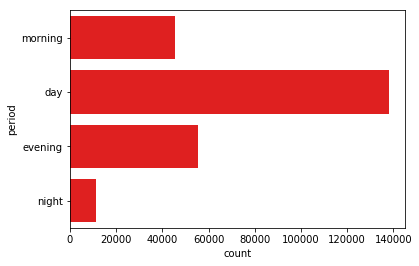

In [25]:
%matplotlib inline
sns.countplot(y='period', data=data_trips, color="r")

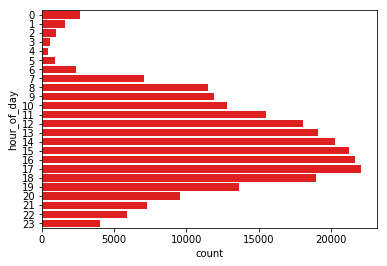

In [26]:
%matplotlib inline
sns.countplot(y='hour_of_day', data=data_trips, color="r")

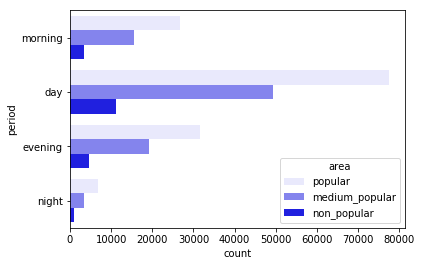

In [27]:
%matplotlib inline
sns.countplot(y='period',hue='area', data=data_trips, color="b")

In [16]:
data_trips['gender'] = data_trips['gender'].astype('category')
data_trips=data_trips[data_trips['gender']!='unknown']

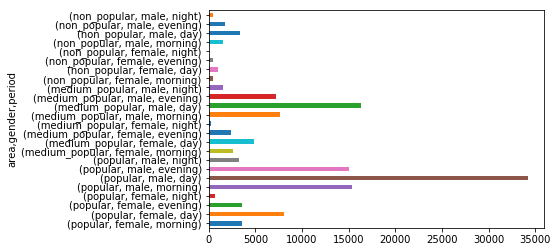

In [29]:
%matplotlib qt 
data_trips.groupby(['area','gender','period']).size().plot(kind='barh',)

The seasons

In [30]:
data_trips['month'].unique()

array([ 3,  7,  8,  6, 10,  2,  4,  9,  5, 11,  1, 12], dtype=int64)

In [17]:
data_trips['season']=['spring' if ((x>=3) & (x<6)) else 'summer' if ((x>=6) & (x<9)) else 'autumn' if ((x>=9)&(x<12)) else 'winter' for x in data_trips['month']]
cat_type=CategoricalDtype(['spring', 'summer', 'autumn', 'winter'], ordered=True)
data_trips['season']=data_trips['season'].astype(cat_type)

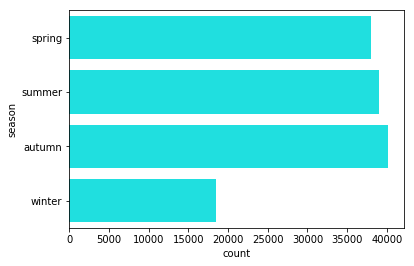

In [32]:
%matplotlib inline
sns.countplot(y='season', data=data_trips, color="cyan")

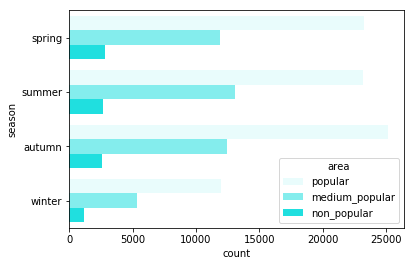

In [33]:
%matplotlib inline
sns.countplot(y='season',hue='area', data=data_trips, color="cyan")

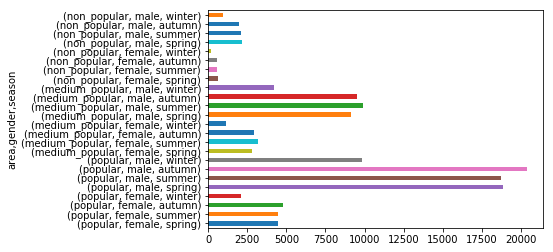

In [34]:
%matplotlib qt 
data_trips.groupby(['area','gender','season']).size().plot(kind='barh',)

In [18]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import cufflinks as cf
cf.go_offline()

In [52]:
data_trips.iplot(kind='bar',x=['period','gender'], y='tripduration')

In [57]:
data_trips.iplot(kind='bar',x=['area','gender'], y='tripduration')